Saving 1_amplitude.jpg to 1_amplitude.jpg


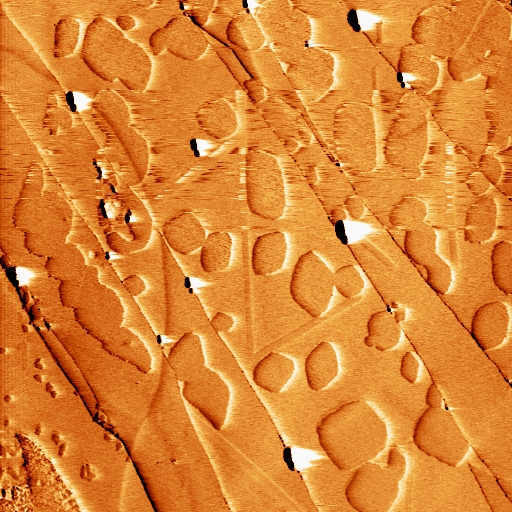

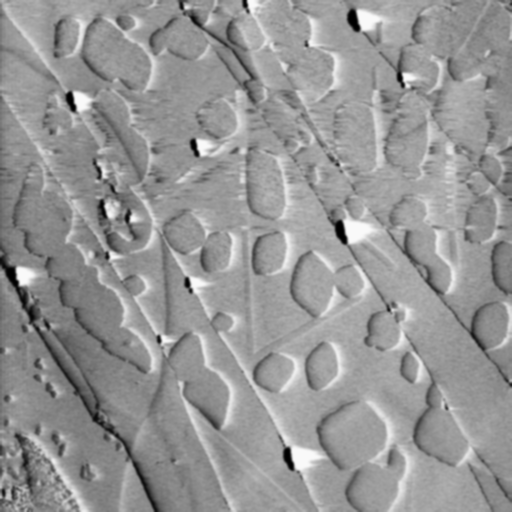

In [ ]:
import cv2
from google.colab import files
from google.colab.patches import cv2_imshow  # Import cv2_imshow for displaying images

# Upload your image file
uploaded = files.upload()

# Get the file name
image_filename = list(uploaded.keys())[0]

# Read the uploaded image in color
colored_image = cv2.imread(image_filename, cv2.IMREAD_COLOR)

# Display the original image
cv2_imshow(colored_image)

# Convert the image to grayscale
gray_image = cv2.cvtColor(colored_image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian Blur to the grayscale image
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Display the blurred image
cv2_imshow(blurred_image)


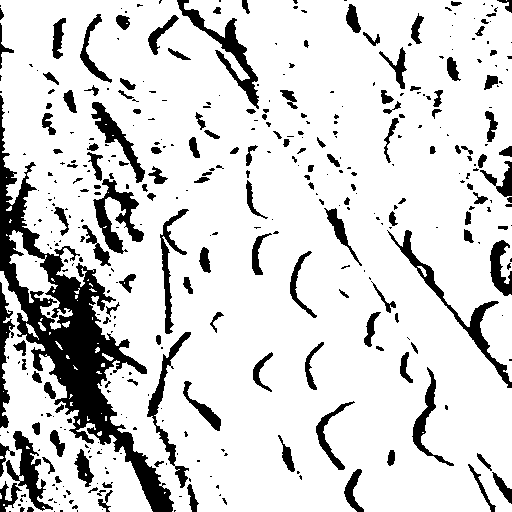

In [ ]:
# Define the threshold value
threshold_value = 127

# Apply thresholding to segment the image
_, thresholded_image = cv2.threshold(blurred_image, threshold_value, 255, cv2.THRESH_BINARY)

# Display the thresholded image
cv2_imshow(thresholded_image)


Saving 1_amplitude.jpg to 1_amplitude (1).jpg


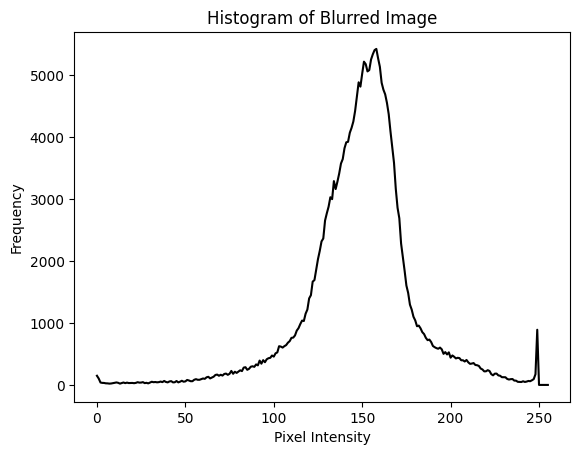

Enter the lower bound: 100
Enter the upper bound: 500


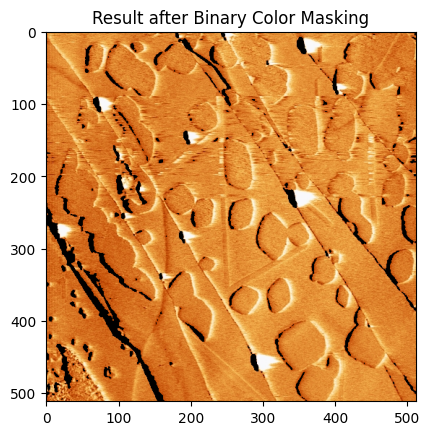

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files
from google.colab.patches import cv2_imshow

# Upload your image file
uploaded = files.upload()

# Get the file name
image_filename = list(uploaded.keys())[0]

# Read the uploaded image in color
colored_image = cv2.imread(image_filename, cv2.IMREAD_COLOR)

# Convert the image to grayscale
gray_image = cv2.cvtColor(colored_image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian Blur to the grayscale image
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Calculate the histogram of the blurred image
hist_values, bin_edges = np.histogram(blurred_image.flatten(), bins=256, range=[0,256])

# Plot the histogram
plt.plot(hist_values, color='black')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.title('Histogram of Blurred Image')
plt.show()

# Manually enter the lower and upper bounds based on the histogram
lower_bound = int(input("Enter the lower bound: "))
upper_bound = int(input("Enter the upper bound: "))

# Create a binary mask within the specified intensity range
mask = cv2.inRange(blurred_image, lower_bound, upper_bound)

# Apply the mask to the original image
result_image = cv2.bitwise_and(colored_image, colored_image, mask=mask)

# Display the result after binary color masking
plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plt.title('Result after Binary Color Masking')
plt.show()


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files

# Upload input image 1 # Image to be aligned.
print("Upload the first image:")
uploaded = files.upload()
img1_color = cv2.imdecode(np.frombuffer(uploaded[list(uploaded.keys())[0]], np.uint8), cv2.IMREAD_COLOR)

# Upload input image 2 # Reference image.
print("\nUpload the second image:")
uploaded = files.upload()
img2_color = cv2.imdecode(np.frombuffer(uploaded[list(uploaded.keys())[0]], np.uint8), cv2.IMREAD_COLOR)



Upload the first image:


Saving 1_amplitude.jpg to 1_amplitude (2).jpg

Upload the second image:


In [ ]:
# Convert to grayscale.
img1 = cv2.cvtColor(img1_color, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2_color, cv2.COLOR_BGR2GRAY)
height, width = img2.shape

# Create ORB detector with 5000 features.
orb_detector = cv2.ORB_create(50000)

# Find keypoints and descriptors.
kp1, d1 = orb_detector.detectAndCompute(img1, None)
kp2, d2 = orb_detector.detectAndCompute(img2, None)

# Match features between the two images.
matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = matcher.match(d1, d2)

# Sort matches on the basis of their Hamming distance.
matches = sorted(matches, key=lambda x: x.distance)

# Take the top 90 % matches forward.
matches = matches[:int(len(matches) * 0.8)]
no_of_matches = len(matches)

# Define empty matrices of shape no_of_matches * 2.
p1 = np.zeros((no_of_matches, 2))
p2 = np.zeros((no_of_matches, 2))

for i in range(len(matches)):
    p1[i, :] = kp1[matches[i].queryIdx].pt
    p2[i, :] = kp2[matches[i].trainIdx].pt

# Find the homography matrix.
homography, mask = cv2.findHomography(p1, p2, cv2.RANSAC)

# Use this matrix to transform the
# colored image wrt the reference image.
transformed_img = cv2.warpPerspective(img1_color,
                                      homography, (width, height))

# Display the input images and the output image.
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img1_color, cv2.COLOR_BGR2RGB))
plt.title('Input Image 1')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(img2_color, cv2.COLOR_BGR2RGB))
plt.title('Input Image 2')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(transformed_img, cv2.COLOR_BGR2RGB))
plt.title('Transformed Image')

plt.show()

# Save the output.
cv2.imwrite('output.jpg', transformed_img)


# Trying Fourier Transform

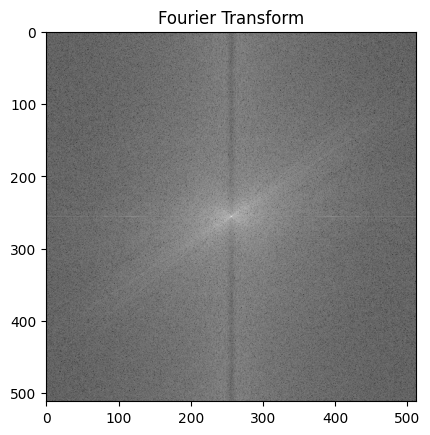

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Specify the path to the uploaded image in Colab
image_path = "/content/1_amplitude.jpg"

# Load the image
image = cv2.imread(image_path)

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Compute the discrete Fourier Transform of the image
fourier = cv2.dft(np.float32(gray), flags=cv2.DFT_COMPLEX_OUTPUT)

# Shift the zero-frequency component to the center of the spectrum
fourier_shift = np.fft.fftshift(fourier)

# Calculate the magnitude of the Fourier Transform
magnitude = 20 * np.log(cv2.magnitude(fourier_shift[:, :, 0], fourier_shift[:, :, 1]))

# Scale the magnitude for display
magnitude = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8UC1)

# Display the magnitude of the Fourier Transform using matplotlib
plt.imshow(magnitude, cmap='gray')
plt.title('Fourier Transform')
plt.show()


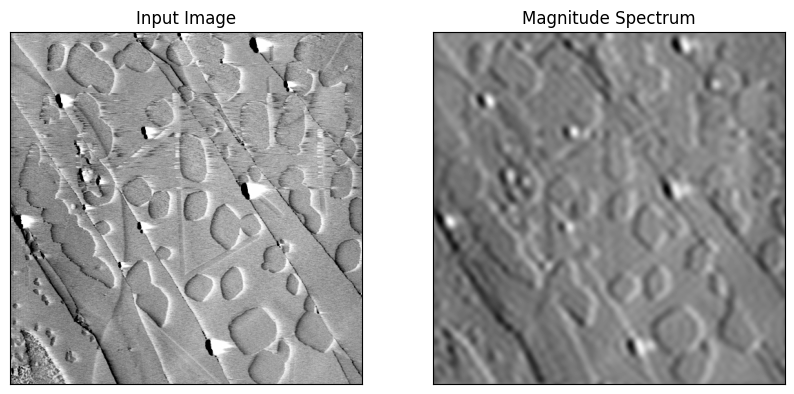

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

# read the input image
# you can specify the path to image
image_path = "/content/1_amplitude.jpg"
image = cv2.imread(image_path, 0)

# calculating the discrete Fourier transform
DFT = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)

# reposition the zero-frequency component to the spectrum's middle
shift = np.fft.fftshift(DFT)
row, col = image.shape
center_row, center_col = row // 2, col // 2

# create a mask with a centered square of 1s
mask = np.zeros((row, col, 2), np.uint8)
mask[center_row - 30:center_row + 30, center_col - 30:center_col + 30] = 1

# put the mask and inverse DFT in place.
fft_shift = shift * mask
fft_ifft_shift = np.fft.ifftshift(fft_shift)
imageThen = cv2.idft(fft_ifft_shift)

# calculate the magnitude of the inverse DFT
imageThen = cv2.magnitude(imageThen[:,:,0], imageThen[:,:,1])

# visualize the original image and the magnitude spectrum
plt.figure(figsize=(10,10))
plt.subplot(121), plt.imshow(image, cmap='gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(imageThen, cmap='gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread, imshow
from skimage.color import rgb2hsv, rgb2gray, rgb2yuv
from skimage import color, exposure, transform
from skimage.exposure import equalize_hist

In [ ]:
dark_image = imread('/content/1_amplitude.jpg')

In [ ]:
dark_image_grey = rgb2gray(dark_image)
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(dark_image_grey, cmap='gray');

In [ ]:
dark_image_grey_fourier = np.fft.fftshift(np.fft.fft2(dark_image_grey))
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(np.log(abs(dark_image_grey_fourier)), cmap='gray');

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray

def fourier_masker_ver(image, i):
    f_size = 15

    # Convert the image to grayscale
    dark_image_grey = rgb2gray(image)

    # Compute the Fourier Transform of the grayscale image
    dark_image_grey_fourier = np.fft.fftshift(np.fft.fft2(dark_image_grey))

    # Apply the mask to the Fourier Transform
    dark_image_grey_fourier[:225, 235:240] = i
    dark_image_grey_fourier[-225:, 235:240] = i

    # Display the Masked Fourier Transform
    fig, ax = plt.subplots(1, 3, figsize=(15, 15))
    ax[0].imshow(np.log(np.abs(dark_image_grey_fourier)), cmap='gray')
    ax[0].set_title('Masked Fourier', fontsize=f_size)

    # Display the Greyscale Image
    ax[1].imshow(dark_image_grey, cmap='gray')
    ax[1].set_title('Greyscale Image', fontsize=f_size)

    # Display the Transformed Greyscale Image
    ax[2].imshow(np.abs(np.fft.ifft2(dark_image_grey_fourier)), cmap='gray')
    ax[2].set_title('Transformed Greyscale Image', fontsize=f_size)

    plt.show()

# Load the image
dark_image = imread('/content/1_amplitude.jpg')

# Example usage: Replace '1' with the value you want to use for masking
fourier_masker_ver(dark_image, 1)


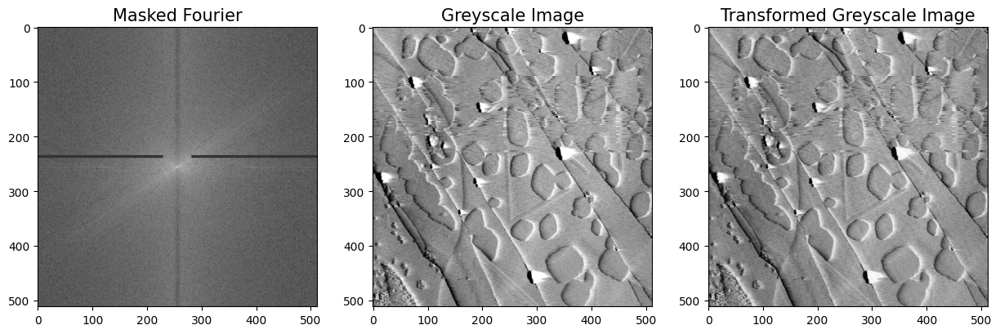

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray

def fourier_masker_hor(image, i):
    f_size = 15

    # Convert the image to grayscale
    dark_image_grey = rgb2gray(image)

    # Compute the Fourier Transform of the grayscale image
    dark_image_grey_fourier = np.fft.fftshift(np.fft.fft2(dark_image_grey))

    # Apply the horizontal mask to the Fourier Transform
    dark_image_grey_fourier[235:240, :230] = i
    dark_image_grey_fourier[235:240, -230:] = i

    # Display the Masked Fourier Transform
    fig, ax = plt.subplots(1, 3, figsize=(15, 15))
    ax[0].imshow(np.log(np.abs(dark_image_grey_fourier)), cmap='gray')
    ax[0].set_title('Masked Fourier', fontsize=f_size)

    # Display the Greyscale Image
    ax[1].imshow(dark_image_grey, cmap='gray')
    ax[1].set_title('Greyscale Image', fontsize=f_size)

    # Display the Transformed Greyscale Image
    ax[2].imshow(np.abs(np.fft.ifft2(dark_image_grey_fourier)), cmap='gray')
    ax[2].set_title('Transformed Greyscale Image', fontsize=f_size)

    plt.show()

# Load the image
dark_image = imread('/content/1_amplitude.jpg')

# Example usage: Replace '1' with the value you want to use for masking
fourier_masker_hor(dark_image, 1)


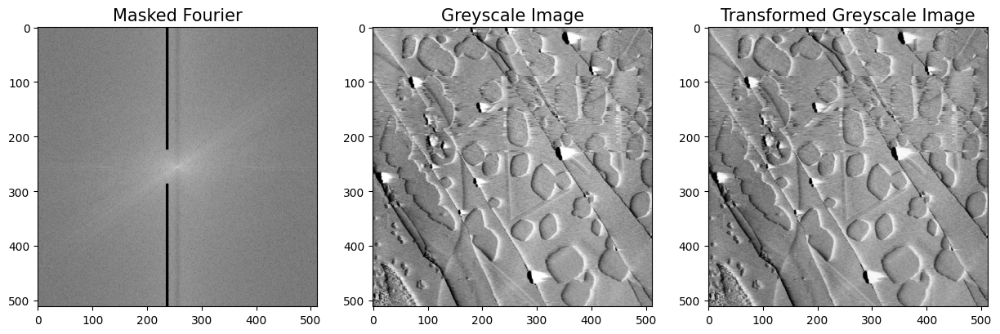

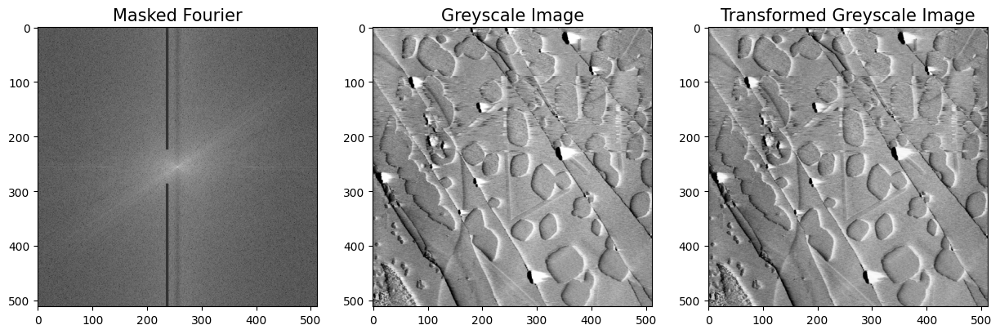

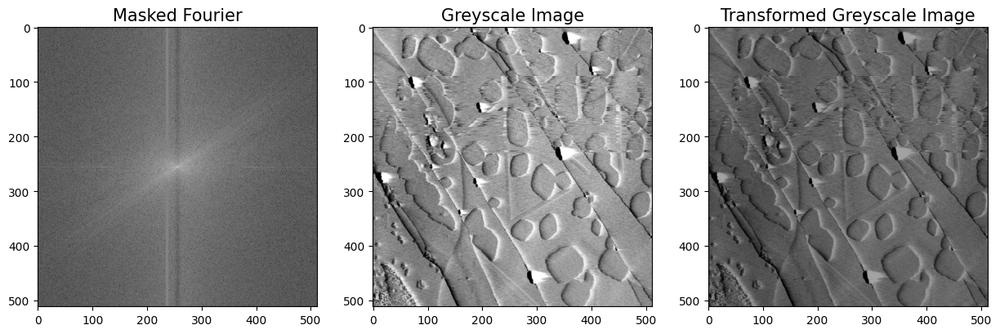

In [ ]:
def fourier_iterator(image, value_list):
    for i in value_list:
        fourier_masker_ver(image, i)

fourier_iterator(dark_image, [0.001, 1, 100])

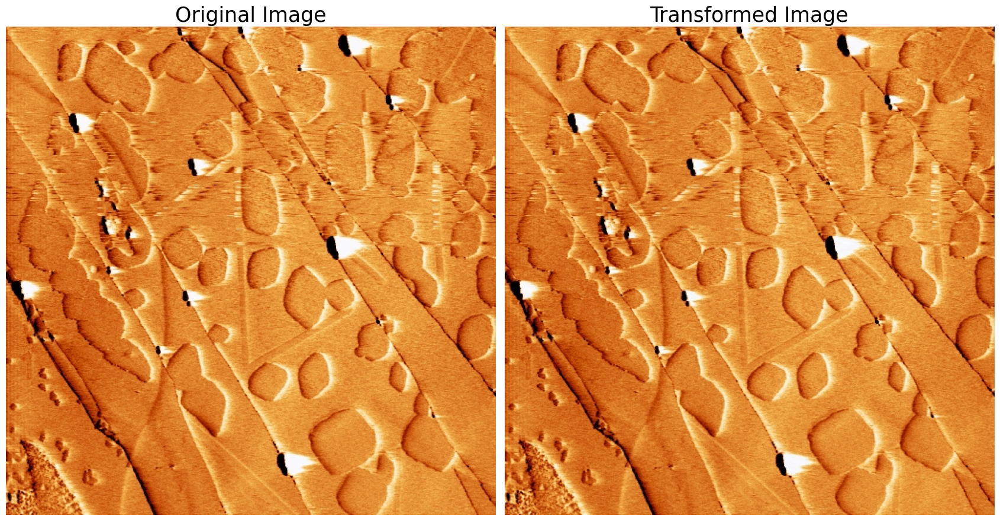

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread

def fourier_transform_rgb(image):
    f_size = 25
    transformed_channels = []

    for i in range(3):
        rgb_fft = np.fft.fftshift(np.fft.fft2(image[:, :, i]))
        rgb_fft[:225, 235:237] = 1
        rgb_fft[-225:, 235:237] = 1
        transformed_channels.append(abs(np.fft.ifft2(rgb_fft)))

    final_image = np.dstack([transformed_channels[0].astype(int),
                             transformed_channels[1].astype(int),
                             transformed_channels[2].astype(int)])

    fig, ax = plt.subplots(1, 2, figsize=(17, 12))

    ax[0].imshow(image)
    ax[0].set_title('Original Image', fontsize=f_size)
    ax[0].set_axis_off()

    ax[1].imshow(final_image)
    ax[1].set_title('Transformed Image', fontsize=f_size)
    ax[1].set_axis_off()

    fig.tight_layout()
    plt.show()

# Load the image
dark_image = imread('/content/1_amplitude.jpg')

# Example usage:
fourier_transform_rgb(dark_image)


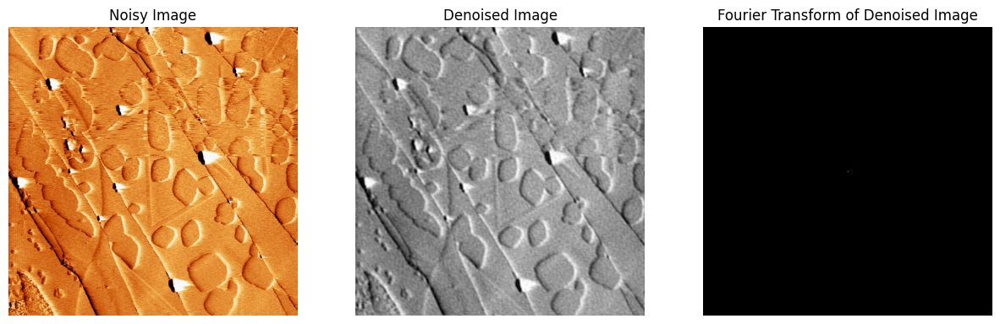

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray, gray2rgb

def remove_noise_fourier(image, threshold):
    # Convert the image to grayscale
    grey_image = rgb2gray(image)

    # Compute the Fourier Transform of the image
    image_fourier = np.fft.fftshift(np.fft.fft2(grey_image))

    # Set high-frequency coefficients to zero based on the threshold
    image_fourier[np.abs(image_fourier) < threshold] = 0

    # Compute the inverse Fourier Transform
    denoised_image_grey = np.abs(np.fft.ifft2(np.fft.ifftshift(image_fourier)))

    # Convert the denoised grayscale image back to RGB
    denoised_image_rgb = gray2rgb(denoised_image_grey)

    return denoised_image_rgb

# Load the noisy image
noisy_image = imread('/content/1_amplitude.jpg')

# Set the threshold for high-pass filtering
threshold_value = 100

# Remove noise using Fourier Transform
denoised_image_rgb = remove_noise_fourier(noisy_image, threshold_value)

# Display the results
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

ax[0].imshow(noisy_image)
ax[0].set_title('Noisy Image')
ax[0].axis('off')

ax[1].imshow(denoised_image_rgb)
ax[1].set_title('Denoised Image')
ax[1].axis('off')

ax[2].imshow(np.abs(np.fft.fftshift(np.fft.fft2(rgb2gray(denoised_image_rgb)))), cmap='gray')
ax[2].set_title('Fourier Transform of Denoised Image')
ax[2].axis('off')

plt.show()


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 1219 pixels
  return func(*args, **kwargs)


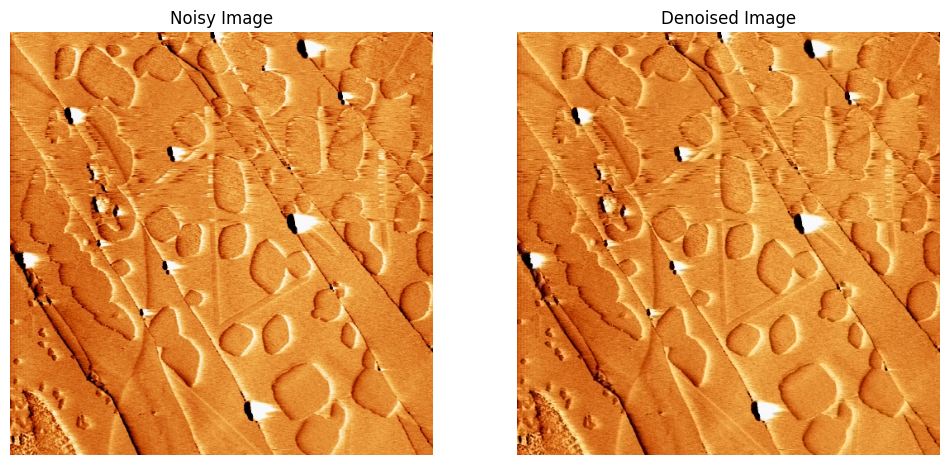

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.filters import median
from skimage.color import rgb2lab, lab2rgb

def remove_noise_median(image, filter_size):
    # Convert the image to LAB color space
    lab_image = rgb2lab(image)

    # Process each LAB channel separately
    for i in range(1, 3):  # Process 'a' and 'b' channels
        lab_channel = lab_image[:, :, i]

        # Apply median filter to the channel
        denoised_channel = median(lab_channel, footprint=np.ones((filter_size, filter_size)))
        lab_image[:, :, i] = denoised_channel

    # Convert the denoised LAB image back to RGB
    denoised_image_rgb = lab2rgb(lab_image)

    return denoised_image_rgb

# Load the noisy image
noisy_image = imread('/content/1_amplitude.jpg')

# Set the filter size for the median filter
filter_size = 10

# Remove noise using median filter
denoised_image_rgb = remove_noise_median(noisy_image, filter_size)

# Display the results
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ax[0].imshow(noisy_image)
ax[0].set_title('Noisy Image')
ax[0].axis('off')

ax[1].imshow(denoised_image_rgb)
ax[1].set_title('Denoised Image')
ax[1].axis('off')

plt.show()


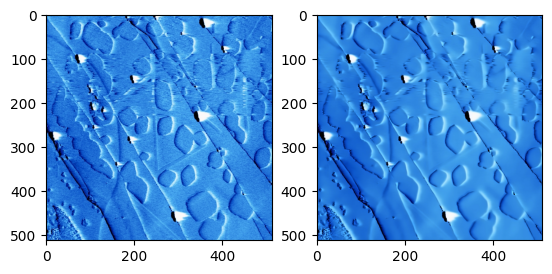

In [ ]:
# importing libraries
import numpy as np
import cv2
from matplotlib import pyplot as plt

# Reading image from folder where it is stored
img = cv2.imread('/content/1_amplitude.jpg')

# denoising of image saving it into dst image
dst = cv2.fastNlMeansDenoisingColored(img, None, 10, 10, 7, 15)

# Plotting of source and destination image
plt.subplot(121), plt.imshow(img)
plt.subplot(122), plt.imshow(dst)

plt.show()

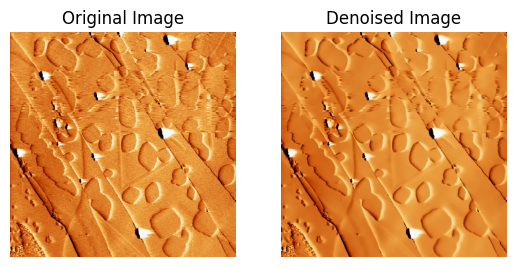

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

# Reading image from folder where it is stored
img = cv2.imread('/content/1_amplitude.jpg')

# denoising of image saving it into dst image
dst = cv2.fastNlMeansDenoisingColored(img, None, 10, 10, 7, 15)

# Plotting of source and destination image
plt.subplot(121), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for proper display
plt.title('Original Image'), plt.axis('off')

plt.subplot(122), plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for proper display
plt.title('Denoised Image'), plt.axis('off')

plt.show()


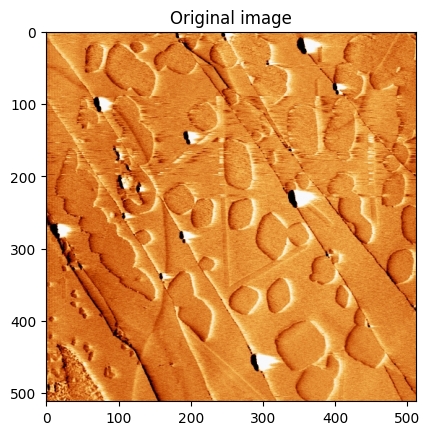

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

im = plt.imread('/content/1_amplitude.jpg').astype(float)

# Normalize the pixel values to the range [0, 1]
im = im / im.max()

plt.figure()
plt.imshow(im, plt.cm.gray)
plt.title('Original image')
plt.show()


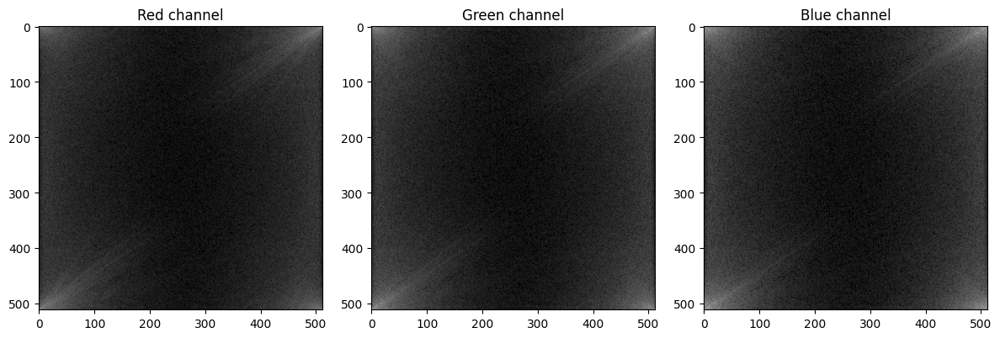

In [ ]:
from scipy import fftpack
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm  # Add this import statement

# Load the image
im = plt.imread('/content/1_amplitude.jpg').astype(float)
im = im / im.max()  # Normalize pixel values to the range [0, 1]

# Compute the Fourier transform for each channel separately
im_fft_r = fftpack.fft2(im[:, :, 0])
im_fft_g = fftpack.fft2(im[:, :, 1])
im_fft_b = fftpack.fft2(im[:, :, 2])

# Show the results for each channel
plt.figure(figsize=(12, 4))

plt.subplot(131)
plt.imshow(np.abs(im_fft_r), cmap='gray', norm=LogNorm(vmin=5))
plt.title('Red channel')

plt.subplot(132)
plt.imshow(np.abs(im_fft_g), cmap='gray', norm=LogNorm(vmin=5))
plt.title('Green channel')

plt.subplot(133)
plt.imshow(np.abs(im_fft_b), cmap='gray', norm=LogNorm(vmin=5))
plt.title('Blue channel')

plt.tight_layout()
plt.show()


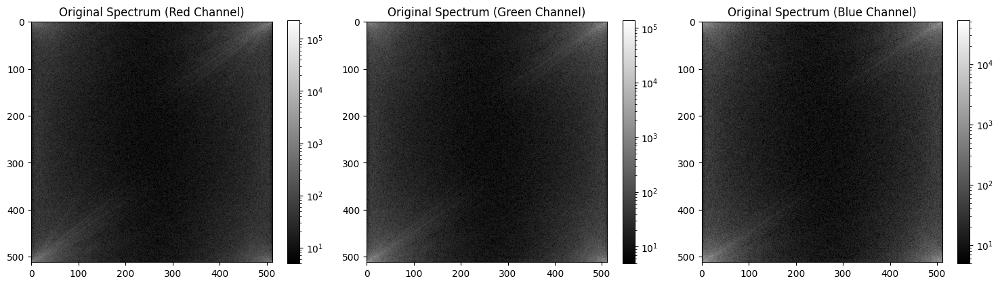

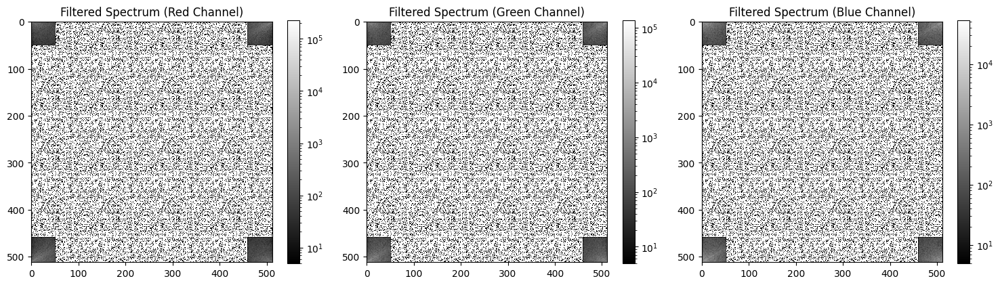

In [ ]:
from scipy import fftpack
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

# Load the image
im = plt.imread('/content/1_amplitude.jpg').astype(float)
im = im / im.max()  # Normalize pixel values to the range [0, 1]

# Compute the Fourier transform for each channel separately
im_fft_r = fftpack.fft2(im[:, :, 0])
im_fft_g = fftpack.fft2(im[:, :, 1])
im_fft_b = fftpack.fft2(im[:, :, 2])

# Function to plot the spectrum
def plot_spectrum(im_fft):
    plt.imshow(np.abs(im_fft), cmap='gray', norm=LogNorm(vmin=5))
    plt.colorbar()

# Show the results for each channel
plt.figure(figsize=(15, 4))

plt.subplot(131)
plot_spectrum(im_fft_r)
plt.title('Original Spectrum (Red Channel)')

plt.subplot(132)
plot_spectrum(im_fft_g)
plt.title('Original Spectrum (Green Channel)')

plt.subplot(133)
plot_spectrum(im_fft_b)
plt.title('Original Spectrum (Blue Channel)')

plt.tight_layout()
plt.show()

# In the lines following, we'll make a copy of the original spectrum and
# truncate coefficients.

# Define the fraction of coefficients (in each direction) we keep
keep_fraction = 0.1

# Call im_fft_r2, im_fft_g2, im_fft_b2 copies of the original transforms.
im_fft_r2 = im_fft_r.copy()
im_fft_g2 = im_fft_g.copy()
im_fft_b2 = im_fft_b.copy()

# Set r and c to be the number of rows and columns of the array.
r, c = im_fft_r2.shape

# Set to zero all rows with indices between r*keep_fraction and
# r*(1-keep_fraction):
im_fft_r2[int(r*keep_fraction):int(r*(1-keep_fraction))] = 0

# Similarly with the columns:
im_fft_r2[:, int(c*keep_fraction):int(c*(1-keep_fraction))] = 0

# Set r and c to be the number of rows and columns of the array.
r, c = im_fft_g2.shape

# Set to zero all rows with indices between r*keep_fraction and
# r*(1-keep_fraction):
im_fft_g2[int(r*keep_fraction):int(r*(1-keep_fraction))] = 0

# Similarly with the columns:
im_fft_g2[:, int(c*keep_fraction):int(c*(1-keep_fraction))] = 0

# Set r and c to be the number of rows and columns of the array.
r, c = im_fft_b2.shape

# Set to zero all rows with indices between r*keep_fraction and
# r*(1-keep_fraction):
im_fft_b2[int(r*keep_fraction):int(r*(1-keep_fraction))] = 0

# Similarly with the columns:
im_fft_b2[:, int(c*keep_fraction):int(c*(1-keep_fraction))] = 0

# Show the results for each channel after filtering
plt.figure(figsize=(15, 4))

plt.subplot(131)
plot_spectrum(im_fft_r2)
plt.title('Filtered Spectrum (Red Channel)')

plt.subplot(132)
plot_spectrum(im_fft_g2)
plt.title('Filtered Spectrum (Green Channel)')

plt.subplot(133)
plot_spectrum(im_fft_b2)
plt.title('Filtered Spectrum (Blue Channel)')

plt.tight_layout()
plt.show()


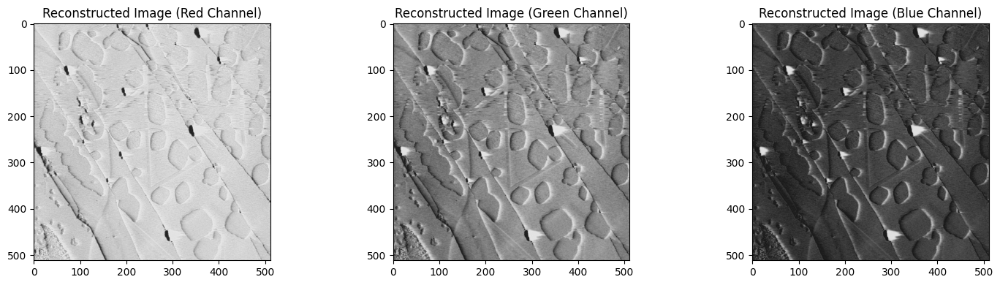

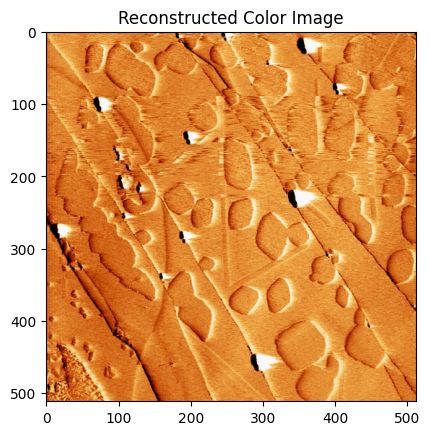

In [ ]:
from scipy import fftpack
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

# Load the image
im = plt.imread('/content/1_amplitude.jpg').astype(float)
im = im / im.max()  # Normalize pixel values to the range [0, 1]

# Compute the Fourier transform for each channel separately
im_fft_r = fftpack.fft2(im[:, :, 0])
im_fft_g = fftpack.fft2(im[:, :, 1])
im_fft_b = fftpack.fft2(im[:, :, 2])

# In the lines following, we'll make a copy of the original spectrum and
# truncate coefficients.

# Define the fraction of coefficients (in each direction) we keep
keep_fraction = 0.4

# Call im_fft_r2, im_fft_g2, im_fft_b2 copies of the original transforms.
im_fft_r2 = im_fft_r.copy()
im_fft_g2 = im_fft_g.copy()
im_fft_b2 = im_fft_b.copy()

# Set r and c to be the number of rows and columns of the array.
r, c = im_fft_r2.shape

# Set to zero all rows with indices between r*keep_fraction and
# r*(1-keep_fraction):
im_fft_r2[int(r*keep_fraction):int(r*(1-keep_fraction))] = 0

# Similarly with the columns:
im_fft_r2[:, int(c*keep_fraction):int(c*(1-keep_fraction))] = 0

# Set r and c to be the number of rows and columns of the array.
r, c = im_fft_g2.shape

# Set to zero all rows with indices between r*keep_fraction and
# r*(1-keep_fraction):
im_fft_g2[int(r*keep_fraction):int(r*(1-keep_fraction))] = 0

# Similarly with the columns:
im_fft_g2[:, int(c*keep_fraction):int(c*(1-keep_fraction))] = 0

# Set r and c to be the number of rows and columns of the array.
r, c = im_fft_b2.shape

# Set to zero all rows with indices between r*keep_fraction and
# r*(1-keep_fraction):
im_fft_b2[int(r*keep_fraction):int(r*(1-keep_fraction))] = 0

# Similarly with the columns:
im_fft_b2[:, int(c*keep_fraction):int(c*(1-keep_fraction))] = 0

# Reconstruct the denoised image from the filtered spectrum, keep only the
# real part for display.
im_new_r = fftpack.ifft2(im_fft_r2).real
im_new_g = fftpack.ifft2(im_fft_g2).real
im_new_b = fftpack.ifft2(im_fft_b2).real

# Combine the reconstructed channels to form the denoised color image
im_new = np.dstack([im_new_r, im_new_g, im_new_b])

# Show the results
plt.figure(figsize=(15, 4))

plt.subplot(131)
plt.imshow(im_new_r, cmap='gray')
plt.title('Reconstructed Image (Red Channel)')

plt.subplot(132)
plt.imshow(im_new_g, cmap='gray')
plt.title('Reconstructed Image (Green Channel)')

plt.subplot(133)
plt.imshow(im_new_b, cmap='gray')
plt.title('Reconstructed Image (Blue Channel)')

plt.tight_layout()
plt.show()

# Display the denoised color image
plt.figure()
plt.imshow(im_new)
plt.title('Reconstructed Color Image')
plt.show()


In [ ]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
img = cv2.imread('/content/1_amplitude.jpg',0) #Load an Image
dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)
magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:,:,0], dft_shift[:,:,1]))

#High frequency pass filter mask

rows, cols = img.shape
crow, ccol = int(rows / 2), int(cols / 2)

mask = np.ones((rows, cols, 2), np.uint8)
r = 20
center = [crow, ccol]
x, y = np.ogrid[:rows, :cols]
mask_area = (x - center[0]) ** 2 + (y - center[1]) ** 2 <= r*r
mask[mask_area] = 0

# apply mask and inverse DFT
fshift = dft_shift * mask

fshift_mask_mag = 2000 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))

f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])



fig = plt.figure(figsize=(12, 12))
ax1 = fig.add_subplot(2,2,1)
ax1.imshow(img, cmap='gray')
ax1.title.set_text('Input Image')
ax2 = fig.add_subplot(2,2,2)
ax2.imshow(magnitude_spectrum, cmap='gray')
ax2.title.set_text('FFT of image')
ax3 = fig.add_subplot(2,2,3)
ax3.imshow(fshift_mask_mag, cmap='gray')
ax3.title.set_text('FFT + Mask')
ax4 = fig.add_subplot(2,2,4)
ax4.imshow(img_back, cmap='gray')
ax4.title.set_text('After inverse FFT')
*/*/plt.show()

SyntaxError: invalid syntax (<ipython-input-15-db2ce5d1efb1>, line 45)

In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
from PIL import Image
import matplotlib.pylab as plt

In [ ]:
from skimage import io
import cv2
from google.colab.patches import cv2_imshow  # Required for displaying images in Google Colab

# Define the file path for the single image
image_path = "/content/1_amplitude.jpg"

# Load the image
image = io.imread(image_path)
image_2 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
final_frame = cv2.hconcat((image, image_2))
cv2_imshow(final_frame)
print('\n')

In [ ]:
from skimage import io

# Define the file path for the image
image_path = "/content/1_amplitude.jpg"

# Load the image
image = io.imread(image_path)

# Print the dtype and shape of the image
print("Data Type (dtype):", image.dtype)
print("Height (shape[0]):", image.shape[0])
print("Width (shape[1]):", image.shape[1])
print("Number of Channels (shape[2]):", image.shape[2])


In [ ]:
plt.hist(image.ravel(),bins = 256, range = [0,256])
plt.show()

In [ ]:
color = ('b','g','r')
for i, col in enumerate(color):
    histr = cv.calcHist([image],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()


In [ ]:
gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

In [ ]:
plt.hist(gray_image.ravel(),bins = 256, range = [0, 256])
plt.show()

In [ ]:
im2 = 255 - gray_image
cv2_imshow(im2)

In [ ]:
im3 = (100.0/255)*gray_image + 100
cv2_imshow(im3)

In [ ]:
imBlur = cv.blur(gray_image,(5,5))
f = np.fft.fft2(imBlur)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 30*np.log(np.abs(fshift))
plt.subplot(121),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
rows, cols = imBlur.shape
crow, ccol = round(rows/2) , round(cols/2)
fshift[crow-10:crow+10, ccol-10:ccol+10] = 0
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)
plt.figure(figsize=([20, 20]))
plt.subplot(131),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(img_back, cmap = 'gray')
plt.title('Image after HPF'), plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(img_back)
plt.title('Result in JET'), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
import cv2
import numpy as np

# Load image in grayscale
img = cv2.imread('/content/1_amplitude.jpg', cv2.IMREAD_GRAYSCALE)

# Pad the image to optimal size
rows, cols = img.shape
padded_img = cv2.copyMakeBorder(img, 0, rows % 2, 0, cols % 2, cv2.BORDER_CONSTANT, value=0)

# Compute Discrete Fourier Transform (DFT)
dft = cv2.dft(np.float32(padded_img), flags=cv2.DFT_COMPLEX_OUTPUT)

# Shift the DFT
dft_shift = np.fft.fftshift(dft)

# Create high-pass filter
rows, cols = padded_img.shape
crow, ccol = rows // 2, cols // 2
mask = np.ones((rows, cols, 2), np.uint8)
mask[crow-30:crow+30, ccol-30:ccol+30] = 0

# Apply the filter
dft_shift_filtered = dft_shift * mask

# Inverse DFT
f_ishift = np.fft.ifftshift(dft_shift_filtered)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

# Normalize the result to display
img_back = cv2.normalize(img_back, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

# Display the filtered image
from google.colab.patches import cv2_imshow

# Display the filtered image
cv2_imshow(img_back)

cv2.waitKey(0)
cv2.destroyAllWindows()
